In [0]:
from pyspark.sql.functions import *
from delta.tables import *

# ✅ Read from the folder with CSV files
df_raw = spark.readStream.format("cloudFiles") \
    .option("cloudFiles.format", "csv") \
    .option("header", "true") \
    .option("cloudFiles.schemaLocation", "/mnt/schema/bronze") \
    .load("/FileStore/tables/stream_input/")

# ✅ Write to Bronze Delta Table
df_raw.writeStream.format("delta") \
    .option("checkpointLocation", "/mnt/checkpoints/bronze") \
    .outputMode("append") \
    .start("/mnt/delta/bronze")


In [0]:
spark.read.format("delta").load("/mnt/delta/bronze").display()


step,type,amount,nameOrig,oldbalanceOrg,newbalanceOrig,nameDest,oldbalanceDest,newbalanceDest,isFraud,isFlaggedFraud,_rescued_data
249,PAYMENT,3119.51,C1515157403,15175.2,12055.69,M880864628,0.0,0.0,0,0,null
249,PAYMENT,11494.08,C1197653668,12055.69,561.61,M1158991064,0.0,0.0,0,0,null
249,PAYMENT,14220.43,C1682344014,561.61,0.0,M1461592831,0.0,0.0,0,0,null
249,PAYMENT,334.8,C89862438,0.0,0.0,M1716146009,0.0,0.0,0,0,null
249,PAYMENT,13467.2,C907984678,0.0,0.0,M271674048,0.0,0.0,0,0,null
249,PAYMENT,34657.33,C1279245281,0.0,0.0,M2017138104,0.0,0.0,0,0,null
249,PAYMENT,4064.65,C991912470,0.0,0.0,M551774431,0.0,0.0,0,0,null
249,PAYMENT,10756.58,C288501649,0.0,0.0,M830766810,0.0,0.0,0,0,null
249,PAYMENT,2027.2,C1900786990,0.0,0.0,M1247120968,0.0,0.0,0,0,null
249,PAYMENT,6208.09,C1243315764,0.0,0.0,M1492892419,0.0,0.0,0,0,null


In [0]:
from pyspark.sql.functions import col, when
from delta.tables import *

# Read from Bronze Delta Table (streaming)
df_bronze = spark.readStream.format("delta").load("/mnt/delta/bronze")

# 🧼 Clean and transform the data
df_silver = df_bronze \
    .withColumnRenamed("nameOrig", "originator") \
    .withColumnRenamed("nameDest", "receiver") \
    .withColumn("is_fraud", col("isFraud").cast("integer")) \
    .withColumn("is_flagged_fraud", col("isFlaggedFraud").cast("integer")) \
    .drop("isFraud", "isFlaggedFraud") \
    .filter(col("amount") > 0)

# 💾 Write to Silver Delta Table
df_silver.writeStream \
    .format("delta") \
    .option("checkpointLocation", "/mnt/checkpoints/silver") \
    .outputMode("append") \
    .start("/mnt/delta/silver")


In [0]:
spark.read.format("delta").load("/mnt/delta/silver").display()


step,type,amount,originator,oldbalanceOrg,newbalanceOrig,receiver,oldbalanceDest,newbalanceDest,_rescued_data,is_fraud,is_flagged_fraud
249,PAYMENT,3119.51,C1515157403,15175.2,12055.69,M880864628,0.0,0.0,null,0,0
249,PAYMENT,11494.08,C1197653668,12055.69,561.61,M1158991064,0.0,0.0,null,0,0
249,PAYMENT,14220.43,C1682344014,561.61,0.0,M1461592831,0.0,0.0,null,0,0
249,PAYMENT,334.8,C89862438,0.0,0.0,M1716146009,0.0,0.0,null,0,0
249,PAYMENT,13467.2,C907984678,0.0,0.0,M271674048,0.0,0.0,null,0,0
249,PAYMENT,34657.33,C1279245281,0.0,0.0,M2017138104,0.0,0.0,null,0,0
249,PAYMENT,4064.65,C991912470,0.0,0.0,M551774431,0.0,0.0,null,0,0
249,PAYMENT,10756.58,C288501649,0.0,0.0,M830766810,0.0,0.0,null,0,0
249,PAYMENT,2027.2,C1900786990,0.0,0.0,M1247120968,0.0,0.0,null,0,0
249,PAYMENT,6208.09,C1243315764,0.0,0.0,M1492892419,0.0,0.0,null,0,0


In [0]:
from pyspark.sql.functions import col, count, sum, avg
from delta.tables import *

# Read from Silver Delta Table (streaming)
df_silver = spark.readStream.format("delta").load("/mnt/delta/silver")

# 🔍 Feature engineering - example aggregations
df_gold = df_silver.groupBy("originator").agg(
    count("*").alias("total_transactions"),
    sum("amount").alias("total_amount_sent"),
    avg("amount").alias("average_amount_sent"),
    sum("is_fraud").alias("fraud_count")
)

# 💾 Write to Gold Delta Table
df_gold.writeStream \
    .format("delta") \
    .option("checkpointLocation", "/mnt/checkpoints/gold") \
    .outputMode("complete") \
    .start("/mnt/delta/gold")


In [0]:
spark.read.format("delta").load("/mnt/delta/gold").display()


originator,total_transactions,total_amount_sent,average_amount_sent,fraud_count
C876714021,1,443010.87,443010.87,0
C224938823,1,2959.54,2959.54,0
C1676650606,1,34739.91,34739.91,0
C289153199,1,371.23,371.23,0
C1181048539,1,17411.44,17411.44,0
C1503438438,1,196626.77,196626.77,0
C765877097,1,63191.19,63191.19,0
C477278966,1,287868.3,287868.3,0
C326407304,1,250341.94,250341.94,0
C1285801989,1,90349.08,90349.08,0


In [0]:
df_gold = spark.read.format("delta").load("/mnt/delta/gold")
df_gold.display()


originator,total_transactions,total_amount_sent,average_amount_sent,fraud_count
C876714021,1,443010.87,443010.87,0
C224938823,1,2959.54,2959.54,0
C1676650606,1,34739.91,34739.91,0
C289153199,1,371.23,371.23,0
C1181048539,1,17411.44,17411.44,0
C1503438438,1,196626.77,196626.77,0
C765877097,1,63191.19,63191.19,0
C477278966,1,287868.3,287868.3,0
C326407304,1,250341.94,250341.94,0
C1285801989,1,90349.08,90349.08,0


In [0]:
# Load from Delta Gold table (preprocessed features)
df_gold = spark.read.format("delta").load("/mnt/delta/gold")

# Display sample
display(df_gold.limit(5))

# Print schema
df_gold.printSchema()

# Count of records
print(f"Gold Table Record Count: {df_gold.count()}")


originator,total_transactions,total_amount_sent,average_amount_sent,fraud_count
C876714021,1,443010.87,443010.87,0
C224938823,1,2959.54,2959.54,0
C1676650606,1,34739.91,34739.91,0
C289153199,1,371.23,371.23,0
C1181048539,1,17411.44,17411.44,0


root
 |-- originator: string (nullable = true)
 |-- total_transactions: long (nullable = true)
 |-- total_amount_sent: double (nullable = true)
 |-- average_amount_sent: double (nullable = true)
 |-- fraud_count: long (nullable = true)

Gold Table Record Count: 6347542


In [0]:
from pyspark.sql.functions import col, isnan, when, count
from pyspark.sql.types import DoubleType, FloatType

def missing_values(df):
    missing_exprs = []
    for c in df.columns:
        dtype = df.schema[c].dataType
        if isinstance(dtype, (DoubleType, FloatType)):
            expr = count(when(col(c).isNull() | isnan(col(c)), c)).alias(c)
        else:
            expr = count(when(col(c).isNull(), c)).alias(c)
        missing_exprs.append(expr)
    return df.select(missing_exprs)

print("=== Missing Values in Gold Table ===")
display(missing_values(df_gold))


=== Missing Values in Gold Table ===


originator,total_transactions,total_amount_sent,average_amount_sent,fraud_count
0,0,0,0,0


In [0]:
from pyspark.sql.functions import col

# Select numeric features
features = ['total_transactions', 'total_amount_sent', 'average_amount_sent', 'fraud_count']

# Convert to Pandas for sklearn
df_pd = df_gold.select(features).dropna().toPandas()


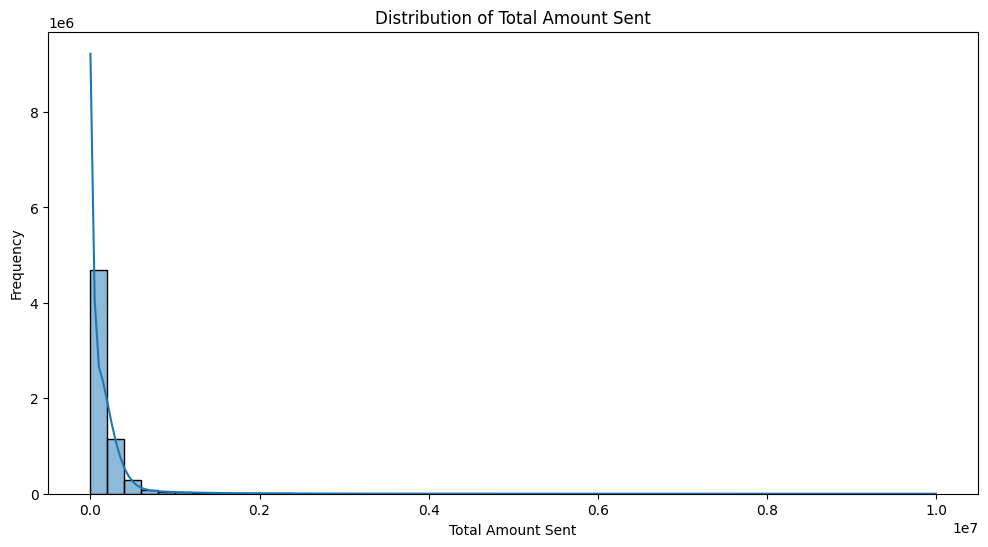

In [0]:
import matplotlib.pyplot as plt
import seaborn as sns

# Histogram of Total Amount Sent
plt.figure(figsize=(12, 6))
sns.histplot(df_pd['total_amount_sent'], bins=50, kde=True)
plt.title('Distribution of Total Amount Sent')
plt.xlabel('Total Amount Sent')
plt.ylabel('Frequency')
plt.show()




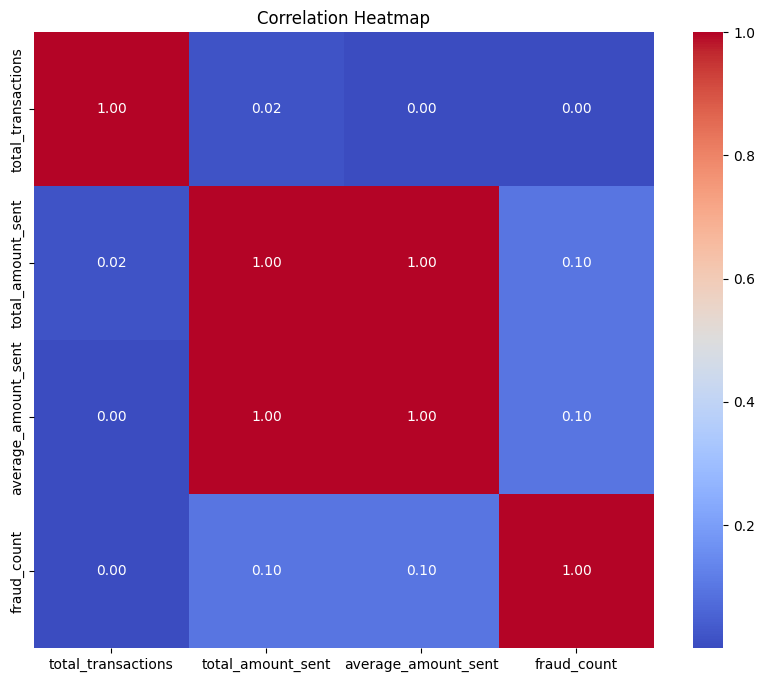

In [0]:
# Correlation Heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(df_pd.corr(), annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Correlation Heatmap")
plt.show()

In [0]:
from sklearn.ensemble import IsolationForest

# Train model
model = IsolationForest(n_estimators=100, contamination=0.01, random_state=42)
df_pd['anomaly_flag'] = model.fit_predict(df_pd)

# 1 = normal, -1 = anomaly -> Convert to 0/1
df_pd['anomaly_flag'] = df_pd['anomaly_flag'].map({1: 0, -1: 1})

# Show sample
df_pd.head(10)


In [0]:
from pyspark.sql import SparkSession
anomaly_sdf = spark.createDataFrame(df_pd)

# Save final output with anomaly flag to Delta Lake
(anomaly_sdf.write
    .format("delta")
    .mode("overwrite")
    .option("overwriteSchema", "true")
    .save("/mnt/delta/anomaly_output"))

print("Anomaly detection results saved to Delta successfully.")


Anomaly detection results saved to Delta successfully.


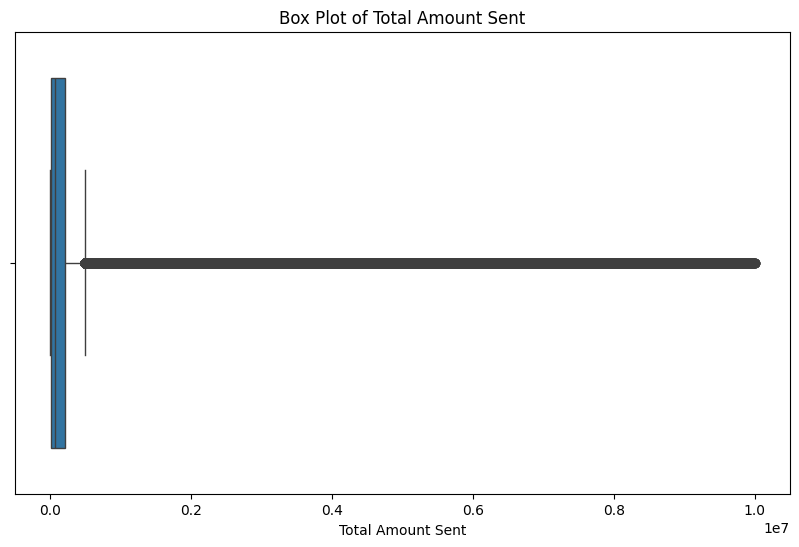

In [0]:
plt.figure(figsize=(10, 6))
sns.boxplot(x=df_pd['total_amount_sent'])
plt.title("Box Plot of Total Amount Sent")
plt.xlabel("Total Amount Sent")
plt.show()


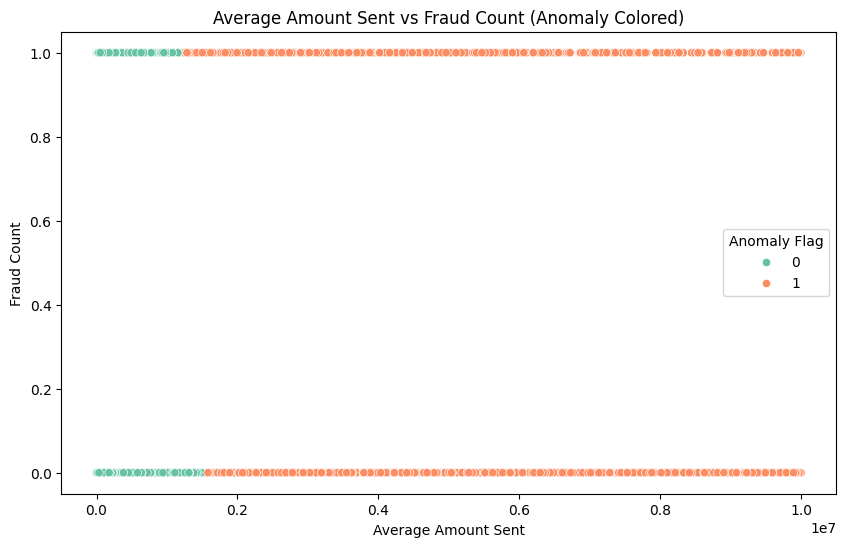

In [0]:
plt.figure(figsize=(10, 6))
sns.scatterplot(data=df_pd, x='average_amount_sent', y='fraud_count', hue='anomaly_flag', palette='Set2')
plt.title("Average Amount Sent vs Fraud Count (Anomaly Colored)")
plt.xlabel("Average Amount Sent")
plt.ylabel("Fraud Count")
plt.legend(title="Anomaly Flag")
plt.show()


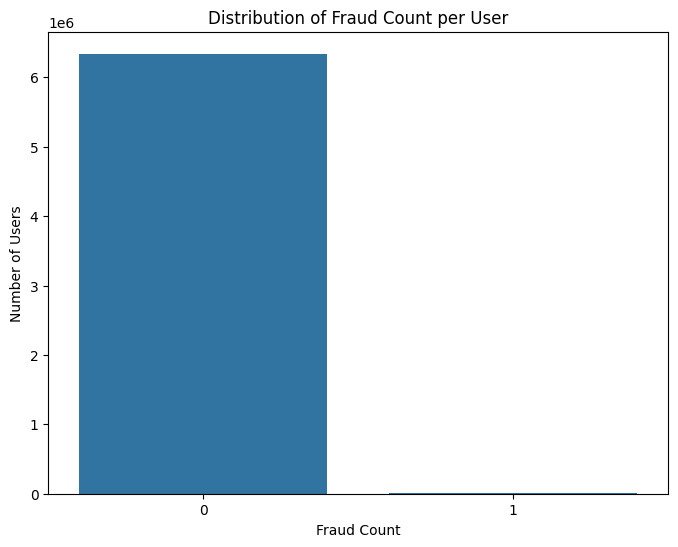

com.databricks.backend.common.rpc.CommandCancelledException
	at com.databricks.spark.chauffeur.ExecContextState.cancel(ExecContextState.scala:434)
	at com.databricks.spark.chauffeur.ExecutionContextManagerV1.cancelExecution(ExecutionContextManagerV1.scala:473)
	at com.databricks.spark.chauffeur.ChauffeurState.$anonfun$process$1(ChauffeurState.scala:750)
	at com.databricks.logging.UsageLogging.$anonfun$recordOperation$1(UsageLogging.scala:510)
	at com.databricks.logging.UsageLogging.executeThunkAndCaptureResultTags$1(UsageLogging.scala:616)
	at com.databricks.logging.UsageLogging.$anonfun$recordOperationWithResultTags$4(UsageLogging.scala:643)
	at com.databricks.logging.AttributionContextTracing.$anonfun$withAttributionContext$1(AttributionContextTracing.scala:49)
	at com.databricks.logging.AttributionContext$.$anonfun$withValue$1(AttributionContext.scala:293)
	at scala.util.DynamicVariable.withValue(DynamicVariable.scala:62)
	at com.databricks.logging.AttributionContext$.withValue(Attr

In [0]:
plt.figure(figsize=(8, 6))
sns.countplot(x='fraud_count', data=df_pd, order=df_pd['fraud_count'].value_counts().index)
plt.title("Distribution of Fraud Count per User")
plt.xlabel("Fraud Count")
plt.ylabel("Number of Users")
plt.show()


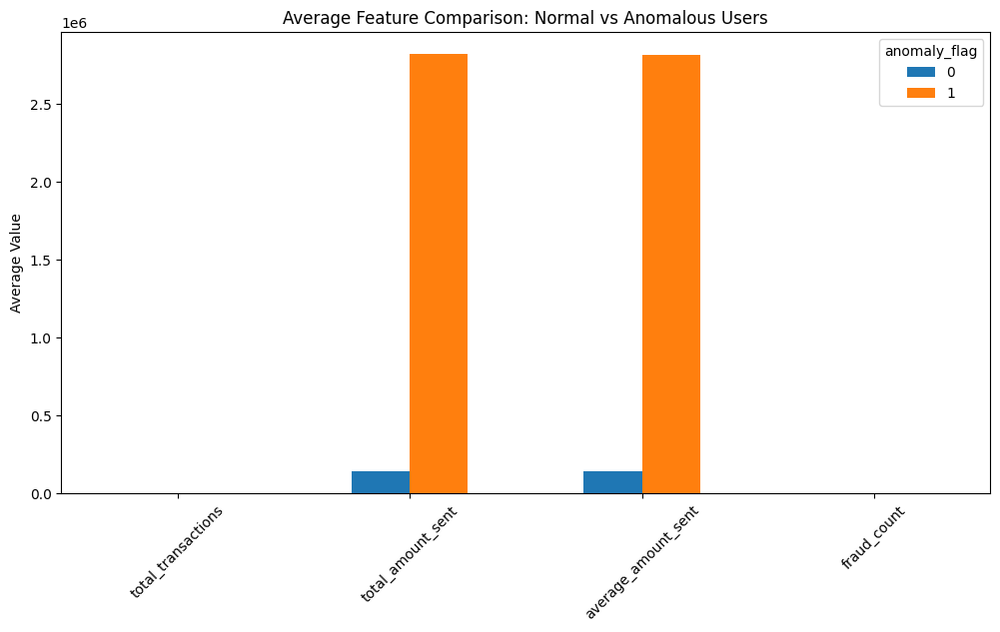

In [0]:
summary_df = df_pd.groupby('anomaly_flag')[features].mean().reset_index()
summary_df = summary_df.rename(columns={0: "Normal", 1: "Anomaly"})

# Plot as bar chart
summary_df.set_index('anomaly_flag').T.plot(kind='bar', figsize=(12,6))
plt.title("Average Feature Comparison: Normal vs Anomalous Users")
plt.ylabel("Average Value")
plt.xticks(rotation=45)
plt.show()
